In [1]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import gensim
import time

from sklearn.decomposition import NMF, TruncatedSVD, LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import pairwise_distances

from pandas import Series, DataFrame
import pandas as pd
%pylab inline

#from gensim.models.coherencemodel import CoherenceModel

import TextCleaning

Populating the interactive namespace from numpy and matplotlib


In [2]:
# pull in raw abstracts

raw_df=pd.read_csv('../../data/original/raw_abstracts.csv',engine='python')

# remove null abstracts and duplicates

df = TextCleaning.remove_nulls(raw_df, "ABSTRACT")
df = TextCleaning.remove_duplicates(df)

df.reset_index(inplace = True)
df.rename(columns={'index':'original index'}, inplace=True)

3 nulls in  ABSTRACT . These rows removed.
11 duplicate abstracts removed
0 project ID duplicates - not removed


In [3]:
df.head()

,original index,PROJECT_ID,ABSTRACT,FY,FIRST_CHAR,LAST_CHAR,DEPARTMENT,AGENCY,IC_CENTER,PROJECT_NUMBER,PROJECT_TITLE,PROJECT_TERMS,CONTACT_PI_PROJECT_LEADER,OTHER_PIS,ORGANIZATION_NAME,CFDA_CODE,FY_TOTAL_COST
0,0,89996,"This is a project to explore Game-based, Metap...",2008,"This is a project to explore Game-based, Metap...",.,NSF,NSF,NaN,0814512,RUI: CYGAMES: CYBER-ENABLED TEACHING AND LEARN...,Achievement; analog; base; Cognitive Science; ...,"REESE, DEBBIE D","CARTER, BEVERLY; WOOD, CHARLES; HITT, BEN",WHEELING JESUIT UNIVERSITY,47.076,1999467.0
1,1,89997,Institution: Franklin Institute Science Museum...,2008,Institution: Franklin Institute Science Museum...,.,NSF,NSF,NaN,0741659,ARIEL - AUGMENTED REALITY FOR INTERPRETIVE AND...,Active Learning; Child; Computer software; des...,"SNYDER, STEVEN","ELINICH, KAREN; YOON, SUSAN",FRANKLIN INSTITUTE,47.076,1799699.0
2,2,89998,Through programs (including small group conver...,2008,Through programs (including small group conver...,.,NSF,NSF,NaN,0813522,BRIGHTER FUTURES: PUBLIC DELIBERATION ABOUT TH...,Address; Age; Birth; Brain; Caregivers; Child;...,"FINK, LAURIE KLEINBAUM","CADIGAN, KAREN; ELLENBOGEN, KIRSTEN",SCIENCE MUSEUM OF MINNESOTA,47.076,1505858.0
3,3,89999,In partnership with the American Chemical Soci...,2008,In partnership with the American Chemical Soci...,.,NSF,NSF,NaN,0838627,FOSTERING US-INTERNATIONAL COLLABORATIVE PARTN...,Advanced Development; American; Chemicals; Che...,"JOST, JOHN W","MILLER, BRADLEY; BOWMAN, KATHERINE",INTERNATIONAL UNION OF PURE AND APPLIED CHEMISTRY,47.049,51000.0
4,4,90000,Amphibian populations around the world are exp...,2008,Amphibian populations around the world are exp...,.,NSF,NSF,NaN,0815315,COLLABORATIVE RESEARCH: EVOLUTION OF AMPHIBIAN...,Amphibia; Central America; Communicable Diseas...,"ZAMUDIO, KELLY R",NaN,CORNELL UNIVERSITY ITHACA,47.074,370996.0


In [4]:
df.dtypes

original index                 int64
PROJECT_ID                     int64
ABSTRACT                      object
FY                             int64
FIRST_CHAR                    object
LAST_CHAR                     object
DEPARTMENT                    object
AGENCY                        object
IC_CENTER                     object
PROJECT_NUMBER                object
PROJECT_TITLE                 object
PROJECT_TERMS                 object
CONTACT_PI_PROJECT_LEADER     object
OTHER_PIS                     object
ORGANIZATION_NAME             object
CFDA_CODE                     object
FY_TOTAL_COST                float64
dtype: object

In [5]:
cfda_dict = pd.read_csv('../../data/CFDA_Dictionary.csv',engine='python')
cfda_dict.dtypes
cfda_dict['clean_CFDA']

def alignCFDA (c):
    c= str(c)
    split_c = c.split(".")
    first_c = split_c[0]
    return first_c
cfda_dict['clean_CFDA'] =  cfda_dict['clean_CFDA'].apply(alignCFDA)
cfda_dict


,clean_CFDA,Program_Title
0,93007,Public Awareness Campaigns on Embryo Adoption
1,93008,Medical Reserve Corps Small Grant Program
2,93011,National Organizations of State and Local Offi...
3,93018,Strengthening Public Health Services at the Ou...
4,93019,Technical Assistance and Provision for Foreign...
...,...,...
432,93994,Maternal and Child Health Services Block Grant...
433,93996,Bioterrorism Training and Curriculum Developme...
434,93997,Assisted Outpatient Treatment
435,93998,"Autism and Other Developmental Disabilities, S..."


# Basic Stats

In [6]:
#Basic data stats
len(df)

550074

In [7]:
#Each row is a different project- no duplicate projects
len(df['PROJECT_ID'].unique())

550074

In [8]:
#Each row is a different project- no duplicate projects
len(df['CONTACT_PI_PROJECT_LEADER'].unique())
#Unique -Project Leaders 
len(df['CONTACT_PI_PROJECT_LEADER'].unique())/len(df) *100

34.6287953984373

In [9]:
def cleanProjectLeaders(c):
    if c ==",":
        return float("Nan")
    else:
        return c
df['CONTACT_PI_PROJECT_LEADER'] = df['CONTACT_PI_PROJECT_LEADER'].apply(cleanProjectLeaders)

Text(0.5, 1.0, 'Top 25 Contact PI Project Leaders')

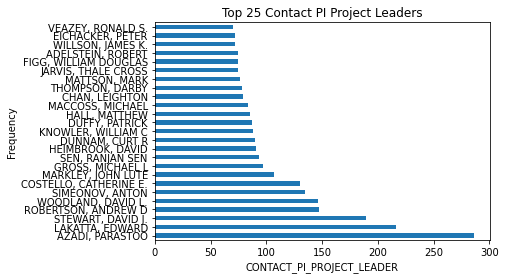

In [10]:
df['CONTACT_PI_PROJECT_LEADER'] =df['CONTACT_PI_PROJECT_LEADER'].dropna(how='any')
cfda_counts= df['CONTACT_PI_PROJECT_LEADER'].value_counts()[:25]
cfda_counts.plot(kind='barh')
xlabel('CONTACT_PI_PROJECT_LEADER')
ylabel('Frequency')
title('Top 25 Contact PI Project Leaders')

In [11]:
#Each row is a different project- no duplicate projects
len(df['OTHER_PIS'].unique())
#Unique -Project Leaders 
len(df['OTHER_PIS'].unique())/len(df) *100

#df['OTHER_PIS'].value_counts()

12.602668004668462

Text(0.5, 1.0, 'Top 25 Other PIS')

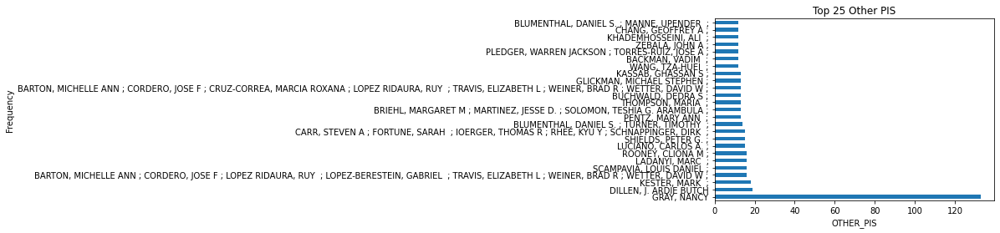

In [12]:
df['OTHER_PIS'] =df['OTHER_PIS'].dropna(how='any')
cfda_counts= df['OTHER_PIS'].value_counts()[:25]
cfda_counts.plot(kind='barh')
xlabel('OTHER_PIS')
ylabel('Frequency')
title('Top 25 Other PIS')

In [13]:
#Each row is a different project- no duplicate projects
len(df['ORGANIZATION_NAME'].unique())
#Unique -Project Leaders 
len(df['ORGANIZATION_NAME'].unique())/len(df) *100
df['ORGANIZATION_NAME'].value_counts()

NATIONAL INSTITUTES OF HEALTH               30154
THE JOHNS HOPKINS UNIVERSITY                 8948
UNIVERSITY OF MICHIGAN AT ANN ARBOR          8733
UNIVERSITY OF WASHINGTON                     8630
STANFORD UNIVERSITY                          7894
                                            ...  
SEGOVIA, DAISY A                                1
VALLEY COMMUNITY DEVELOP CORP                   1
MORDECAI, ERIN A                                1
FOUNDATION FOR WORKER/VETERAN/ENVIR/HLTH        1
DOPHEN BIOMED INC                               1
Name: ORGANIZATION_NAME, Length: 16027, dtype: int64

Text(0.5, 1.0, 'Top 25 ORGANIZATIONS')

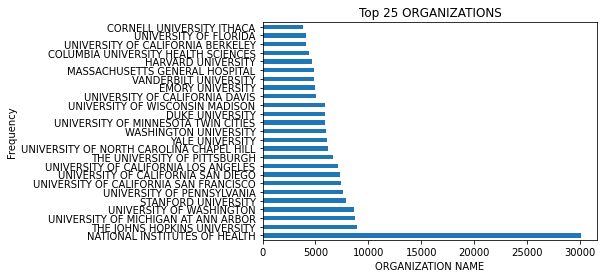

In [14]:
df['ORGANIZATION_NAME'] =df['ORGANIZATION_NAME'].dropna(how='any')
cfda_counts= df['ORGANIZATION_NAME'].value_counts()[:25]
cfda_counts.plot(kind='barh')
xlabel('ORGANIZATION NAME')
ylabel('Frequency')
title('Top 25 ORGANIZATIONS')

In [15]:
len(df['ORGANIZATION_NAME'].unique())

16028

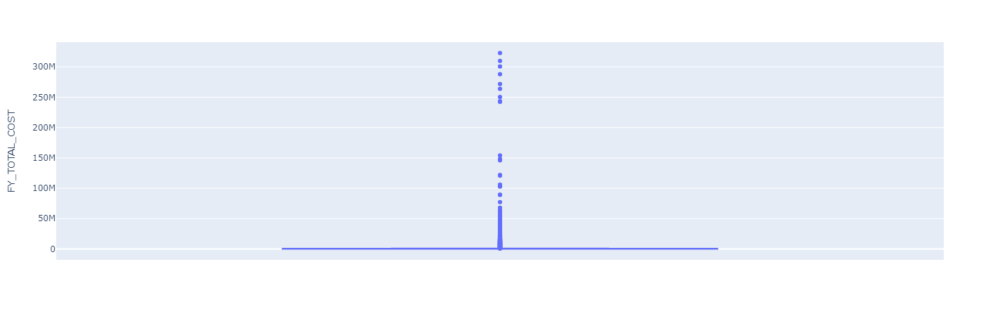

In [16]:
#FY-Cost
import plotly.express as px
fig = px.box(df, y="FY_TOTAL_COST")
fig.show()

Text(0.5, 1.0, 'Year by Year Total Cost Distribution')

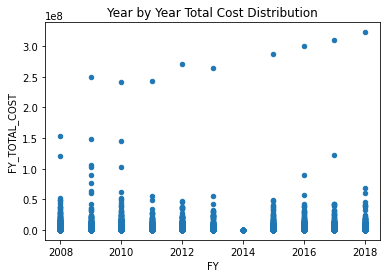

In [35]:
df.plot.scatter(x= "FY",y = "FY_TOTAL_COST")
title("Year by Year Total Cost Distribution")

In [33]:
df['FY_TOTAL_COST_BUCKET'] = pd.qcut(df['FY_TOTAL_COST'],10)
df['FY_TOTAL_COST_BUCKET'].value_counts()
df['FY_TOTAL_COST_BUCKET']  = df['FY_TOTAL_COST_BUCKET'].astype(str)




#visdf = df[['FY_TOTAL_COST_BUCKET','ORGANIZATION_NAME']]
#visdf.groupby(['FY_TOTAL_COST_BUCKET']).agg('count').unstack(1).plot(kind='bar',subplots = True)

#CFDA Code

Text(0.5, 1.0, 'Top 25 CFDA Codes')

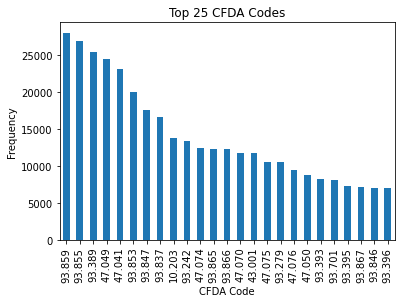

In [18]:
df['CFDA_CODE'].value_counts()
len(df['CFDA_CODE'])
df['CFDA_CODE'] =df['CFDA_CODE'].dropna(how='any')
cfda_counts= df['CFDA_CODE'].value_counts()[:25]
cfda_counts.plot(kind='bar')
xlabel('CFDA Code')
ylabel('Frequency')
title('Top 25 CFDA Codes')

In [19]:
#Feature Engineering CFDA Code
# https://www.osp.pitt.edu/what-cfda-number#:~:text=What%20is%20a%20CFDA%20Number%3F,assigned%20a%20unique%20number%20(XX. - meaning

def getFundingAgencyCFDA(cfda):
    string_cfda = str(cfda)
    split_cfda = string_cfda.split(".")
    fundingagency= split_cfda[0]
    return fundingagency
df['FUNDING_AGENCY_CFDA'] =  df['CFDA_CODE'].apply(getFundingAgencyCFDA)

df['FUNDING_AGENCY_CFDA']

0          47
1          47
2          47
3          47
4          47
         ... 
550069    nan
550070     93
550071    nan
550072     93
550073     93
Name: FUNDING_AGENCY_CFDA, Length: 550074, dtype: object

In [20]:
def getProgramCFDA(cfda):
    string_cfda = str(cfda)
    split_cfda = string_cfda.split(".")
    if len(split_cfda) == 2:
        program=split_cfda[1]
        return program
    else:
        return np.nan
            
df['Program_CFDA'] = df['CFDA_CODE'].apply(getProgramCFDA)

df['Program_CFDA']

df.head(100)

,original index,PROJECT_ID,ABSTRACT,FY,FIRST_CHAR,LAST_CHAR,DEPARTMENT,AGENCY,IC_CENTER,PROJECT_NUMBER,PROJECT_TITLE,PROJECT_TERMS,CONTACT_PI_PROJECT_LEADER,OTHER_PIS,ORGANIZATION_NAME,CFDA_CODE,FY_TOTAL_COST,FY_TOTAL_COST_BUCKET,FUNDING_AGENCY_CFDA,Program_CFDA
0,0,89996,"This is a project to explore Game-based, Metap...",2008,"This is a project to explore Game-based, Metap...",.,NSF,NSF,NaN,0814512,RUI: CYGAMES: CYBER-ENABLED TEACHING AND LEARN...,Achievement; analog; base; Cognitive Science; ...,"REESE, DEBBIE D","CARTER, BEVERLY; WOOD, CHARLES; HITT, BEN",WHEELING JESUIT UNIVERSITY,47.076,1999467.0,"(777500.0, 322798326.0]",47,076
1,1,89997,Institution: Franklin Institute Science Museum...,2008,Institution: Franklin Institute Science Museum...,.,NSF,NSF,NaN,0741659,ARIEL - AUGMENTED REALITY FOR INTERPRETIVE AND...,Active Learning; Child; Computer software; des...,"SNYDER, STEVEN","ELINICH, KAREN; YOON, SUSAN",FRANKLIN INSTITUTE,47.076,1799699.0,"(777500.0, 322798326.0]",47,076
2,2,89998,Through programs (including small group conver...,2008,Through programs (including small group conver...,.,NSF,NSF,NaN,0813522,BRIGHTER FUTURES: PUBLIC DELIBERATION ABOUT TH...,Address; Age; Birth; Brain; Caregivers; Child;...,"FINK, LAURIE KLEINBAUM","CADIGAN, KAREN; ELLENBOGEN, KIRSTEN",SCIENCE MUSEUM OF MINNESOTA,47.076,1505858.0,"(777500.0, 322798326.0]",47,076
3,3,89999,In partnership with the American Chemical Soci...,2008,In partnership with the American Chemical Soci...,.,NSF,NSF,NaN,0838627,FOSTERING US-INTERNATIONAL COLLABORATIVE PARTN...,Advanced Development; American; Chemicals; Che...,"JOST, JOHN W","MILLER, BRADLEY; BOWMAN, KATHERINE",INTERNATIONAL UNION OF PURE AND APPLIED CHEMISTRY,47.049,51000.0,"(47210.0, 103394.0]",47,049
4,4,90000,Amphibian populations around the world are exp...,2008,Amphibian populations around the world are exp...,.,NSF,NSF,NaN,0815315,COLLABORATIVE RESEARCH: EVOLUTION OF AMPHIBIAN...,Amphibia; Central America; Communicable Diseas...,"ZAMUDIO, KELLY R",NaN,CORNELL UNIVERSITY ITHACA,47.074,370996.0,"(342691.0, 400000.0]",47,074
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,90101,The Mathematics Teacher Transformation Instit...,2008,The Mathematics Teacher Transformation Instit...,.,NSF,NSF,NaN,0832247,MATHEMATICS TEACHER TRANSFORMATION INSTITUTES,Action Research; base; Cities; college; Develo...,"FEINERMAN, ROBERT","WOLFE, MARCIE; GNINGUE, SERIGNE; MENENDEZ, SON...",RESEARCH FOUNDATION OF THE CITY UNIVERSITY OF ...,47.076,4051562.0,"(777500.0, 322798326.0]",47,076
96,97,90102,Arizona State University (ASU) in collaboratio...,2008,Arizona State University (ASU) in collaboratio...,.,NSF,NSF,NaN,0833773,COMPUGIRLS: A CULTURALLY RELEVANT TECHNOLOGY P...,3-Dimensional; Administrator; Adolescent; Area...,"SCOTT, KIMBERLY A","AIST, GREGORY; HAYES, ELISABETH; HUSMAN, JENEF...",ARIZONA STATE UNIVERSITY-TEMPE CAMPUS,47.076,879425.0,"(777500.0, 322798326.0]",47,076
97,98,90103,"In most areas of human knowledge, the informat...",2008,"In most areas of human knowledge, the informat...",.,NSF,NSF,NaN,0835531,CDI TYPE II: COLLABORATIVE RESEARCH: SPARSE IN...,Algorithms; Area; Collaborations; Computer sof...,"YU, BIN","GHAOUI, LAURENT EL",UNIVERSITY OF CALIFORNIA BERKELEY,47.075,1341676.0,"(777500.0, 322798326.0]",47,075
98,99,90104,Designing a response to global climate change ...,2008,Designing a response to global climate change ...,.,NSF,NSF,NaN,0825915,COLLABORATIVE RESEARCH: DRU: AN IMPROVED MODEL...,Climate; climate change; cost; Costs and Benef...,"WEBSTER, MORT D","JACOBY, HENRY",MASSACHUSETTS INSTITUTE OF TECHNOLOGY,47.075,442082.0,"(400000.0, 507663.0]",47,075


Text(0.5, 1.0, 'Top 10 Funding Agencies from CFDA Code')

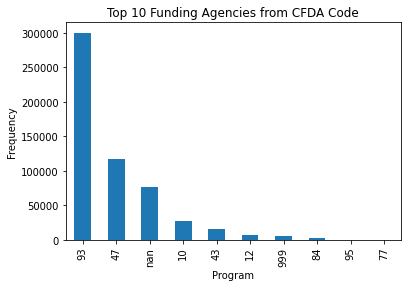

In [21]:
cost_counts = df['FUNDING_AGENCY_CFDA'].value_counts()[:10]
cost_counts.plot(kind='bar')
xlabel('Program')
ylabel('Frequency')
title('Top 10 Funding Agencies from CFDA Code')

In [22]:
def matchCFDACode(c):
    string_cfda = str(c)
    split_cfda = string_cfda.split(".")
    if len(split_cfda) == 2:
        no_dot_cfda  = split_cfda[0]+split_cfda[1]
        return no_dot_cfda
    else:
        return np.nan
df['clean_CFDA'] = df['CFDA_CODE'].apply(matchCFDACode)

    

In [23]:
full_df = pd.merge(left=df, right=cfda_dict, left_on = "clean_CFDA", right_on = "clean_CFDA")
full_df['Program_Title'].value_counts()

Biomedical Research and Research Training                                       28035
Allergy and Infectious Diseases Research                                        26970
Drug Abuse and Addiction Research Programs                                      20930
Extramural Research Programs in the Neurosciences and Neurological Disorders    20066
Diabetes, Digestive, and Kidney Diseases Extramural Research                    17508
                                                                                ...  
Project Grants and Cooperative Agreements for Tuberculosis Control Programs         1
Grants to States to Support Oral Health Workforce Activities                        1
Emerging Infections Sentinel Networks                                               1
Protection and Advocacy for Individuals with Mental Illness                         1
ARRA � Grants to Health Center Programs                                             1
Name: Program_Title, Length: 107, dtype: int64

Text(0.5, 1.0, 'Top 25 Program Titles from CFDA Code')

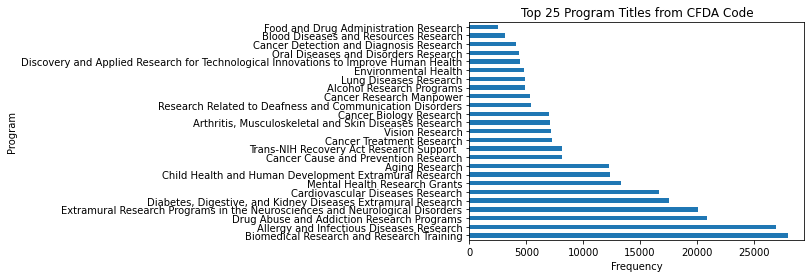

In [24]:
program_counts = full_df['Program_Title'].value_counts()[:25]
program_counts.plot(kind='barh')
xlabel('Frequency')
ylabel('Program')
title('Top 25 Program Titles from CFDA Code')

In [25]:
#import plotly.express as px

In [26]:
#import plotly.express as px
#fig = px.scatter(df, x="FY_TOTAL_COST", y = "FY_TOTAL_COST_BUCKET")
#fig.show()

TypeError: Object of type Interval is not JSON serializable